# IPyPublish - Notebook conversion

*Note: this notebook should be converted to PDF with the following command:*

```
nbpublish -pdf <notebook-name>.ipynb
```


*You can also add the `-f nbpublish_config.json` parameter and customize the `.json` file. You have to install [IPyPublish](https://ipypublish.readthedocs.io/en/latest/index.html) first. Also note that this cell will not be part of the output since it contains the following metadata:*

```
{
    "ipub": {
        "ignore": true
    }
}
```

# Initialization

Rationale: import everything here, define generic plot params, define utility functions.

## Plot parameters

In [1]:
# https://stackoverflow.com/a/39566040/11552622
rcparams = {
    'axes.titlesize':13,
    'axes.labelsize':9,
    'xtick.labelsize':8,
    'ytick.labelsize':8
}

## Imports

In [2]:
import numpy as np
import seaborn as sns
from matplotlib.gridspec import GridSpec
import scipy.io as sio
from buildingspy.io.outputfile import Reader

In [3]:
# IPyPublish customization of matplotlib.pyplot and pandas
from ipypublish import nb_setup
plt = nb_setup.setup_matplotlib(output=('pdf','svg'), rcparams=rcparams)
pd = nb_setup.setup_pandas(escape_latex=False)

In [4]:
# Float display precision
pd.set_option('precision', 2)
# Style
sns.set(style='whitegrid')

## Path setup

In [5]:
file_names = {
    # Results summary table
    'table': 'table.csv', 
    # Hemodynamic parameters
    'Xexact': 'Xexact.csv', 'Xpred':'Xpredicted.csv',
    # DNN responses
    'Ytest':'Ytest.txt', 'Ypred':'Ytestpred.txt',
    # Simulation files
    'simulation': 'Ursino1998Model_VAD2_{}_{}.mat'
}

In [6]:
prefix = '/media/maousi/Data/tmp/'
suffix = '/results/'
results_folders = {
    # Boolean: artificial pulse
    False: {
        # Integer: RPM
        4000: 'simulations_2020_03_21',
        5000: 'simulation_LVAD_RPM5000_2020_04_21',
        6000: 'simulation_LVAD_RPM6000_2020_04_22',
        # Convention: put the simulations without LVAD here, i.e. RPM=0
        0:    'simulation_noLVAD_2020_04_15'
    },
    True: {
        # Integer: RPM
        4000: 'simulation_LVAD_RPM4000_Pulse_T30_N2000_2020_04_26',
        5000: 'simulation_LVAD_RPM5000_Pulse_T30_N2000_2020_04_26',
        6000: 'simulation_LVAD_RPM6000_Pulse_T30_N2000_2020_04_26'
    }
}
for ap, dic in results_folders.items():
    for rpm, path in dic.items():
        dic[rpm] = prefix+path+suffix

## Utility functions

### Results tables



In [7]:
# Define utility function to format results table
def format_table(table):
    table.index = [
        'Min exact', 'Max exact', 'Mean exact', 'SD exact', 'Min predicted', 
        'Max predicted', 'Mean predicted', 'SD predicted', 'Mean error matrix', 
        'Mean rel error * 100', 'SD error', 'CI min', 'CI max',
    ]
    table.columns = [
        'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
        'LVEDV', 'LVESV', 'CI', 'PCPW'
    ]
    # Multiply relative error by 100
    table.loc['Mean rel error * 100', :] = table.loc['Mean rel error * 100', :] * 100

In [8]:
# Load the table, format it and return it
def get_results_table(artificial_pulse, RPM):
    """
    :param artificial_pulse: bool
    :param RPM: int
    """
    df = pd.read_csv(
        results_folders[artificial_pulse][RPM] + file_names['table'], 
        header=None
    )
    format_table(df)
    return df

### DNN performance

In [9]:
# Column names
dnnperf_params_ = ['Emax', 'Emax0', 'G_Emax', 'k_E']

In [10]:
# For plots
dnnperf_params = [r'$E_{max,lv}$', r'$E_{max,lv,0}$',
                  r'$G_{E_{max,lv}}$', r'$k_{E,lv}$']

In [11]:
def load_Ys(ap, RPM):
    Ytest = pd.read_csv(results_folders[ap][RPM]
                        + file_names['Ytest'], sep=' ', header=None)
    Ytestpred = pd.read_csv(results_folders[ap][RPM]
                            +file_names['Ypred'], sep=' ', header=None)
    Ytest.columns = dnnperf_params_
    Ytestpred.columns = dnnperf_params_
    return Ytest, Ytestpred

In [12]:
def plot_dnn_performance(artificial_pulse, RPM):
    
    fig, ax = plt.subplots(2, 2, figsize=(10,6))
    axlst = ax.ravel()
    Ytest, Ypred = load_Ys(artificial_pulse, RPM)
    
    for i,col in enumerate(dnnperf_params_):
        axlst[i].scatter(Ytest.loc[:, col], Ypred.loc[:, col], s=3)
        axlst[i].set_title(dnnperf_params[i])
        axlst[i].set_xlabel(r'Exact')
        axlst[i].set_ylabel(r'Predicted')
    
    offset = .0005
    ax[1, 1].set_xlim([Ytest.loc[:, 'k_E'].min()-offset, Ytest.loc[:, 'k_E'].max()+offset])
    ax[1, 1].set_ylim([Ypred.loc[:, 'k_E'].min()-offset, Ypred.loc[:, 'k_E'].max()+offset])
    
    plt.subplots_adjust(wspace=0.3, hspace=.5)

# Introduction

## Aim

Compare DNN test simulations with and without Heart Mate III Artificial Pulse feature.

## Simluations


### Simulation time

The simulations with the Artificial Pulse were performed on a longer simulation time (30s) compared to continuous-flow simulations (20s), since pulsatile simulation signals take a little longer to stabilize. The number of intervals were also increased to 2000 for pulsatile flow (vs 500 for continuous-flow).

### Pulsatile flow simulations


In [13]:
# Define: variables to load
variables = ['SystemicArteries.PC', 'AorticValve.Inlet.Q',
             'SystemicArteries.Inlet.Q', 'LVAD.RPM']
# Define folder
folder_standalone_sim = '/media/maousi/Data/tmp/standalone_simulations/'

In [14]:
# Data structure: nested dictionnaries
# level 1 = heart failure, level 2 = rpm
data_sim = {
    hf_level: {rpm: None for rpm in [4000, 5000, 6000]}
    for hf_level in ['MHF', 'SHF']
}

In [15]:
def time_range(tmin, tmax, t, signal):
    ids = np.where(np.logical_and(t >= tmin, t <= tmax))
    return t[ids], signal[ids]

def read_simulations(path, file_format, data, variables, tmin, tmax):
    for hf_level, subdata in data.items():
        for rpm in subdata:
            file = path + file_format.format(hf_level, rpm)
            reader = Reader(file, 'dymola')
            subdata[rpm] = [
                time_range(tmin, tmax, *reader.values(v)) for v in variables
            ]

In [16]:
read_simulations(
    path=folder_standalone_sim, file_format=file_names['simulation'],
    data=data_sim, variables=variables, tmin=20.0, tmax=30.0
)

In [17]:
# We have 2 heart failure levels * 3 rpm levels = 6 simulations
# The function handles data for a given heart failure level
def plot_simulations(data_hf):
    fig, ax = plt.subplots(len(data_hf), 1, figsize=(10, 12))

    for i, (rpm_c, data) in enumerate(data_hf.items()):
        ax1 = ax[i]
        ax2 = ax1.twinx()

        (t1, pressure), (t2, valve_flow), (t3, arotic_flow), (t4, rpm) = data
        #(t1, pressure), (t2, valve_flow), (t3, arotic_flow), (t4, rpm) = data[0], data[1], data[2], data[3]
        ax1.plot(t4, rpm/100, 'k--', linewidth=1)
        ax1.plot(t1, pressure, 'b')
        ax2.plot(t2, valve_flow, 'g--', linewidth=1)
        ax2.plot(t3, arotic_flow, 'r')
        #ax2.set_ylim([min(flow)-25, max(flow)+25])
        #ax1.set_ylim(-5, max(max(pressure), max(flow)))
        #ax2.plot(t2, flow)

        ax1.set_xlabel('time')
        ax1.set_ylabel('Systemic pressure [mmHg]\nRPM / 100')
        ax2.set_ylabel('Valve flow [ml/s]\nAortic flow [ml/s]')
        #ax1.yaxis.label.set_color('b')
        # Align the grids
        #ax2.set_yticks(np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(ax1.get_yticks())))
        ax2.grid(False)
        ax1.set_title('RPM mean = {}'.format(rpm_c))

    plt.subplots_adjust(hspace=.4)

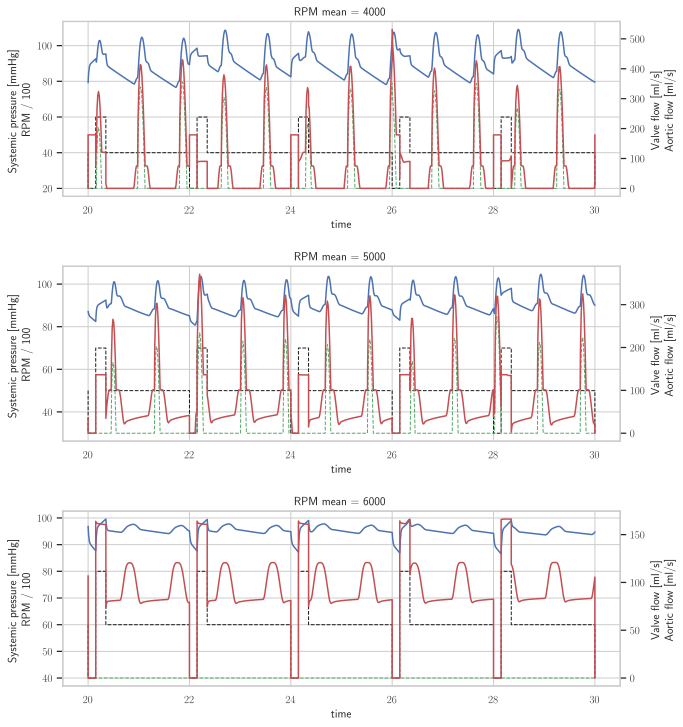

In [18]:
plot_simulations(data_sim['MHF'])

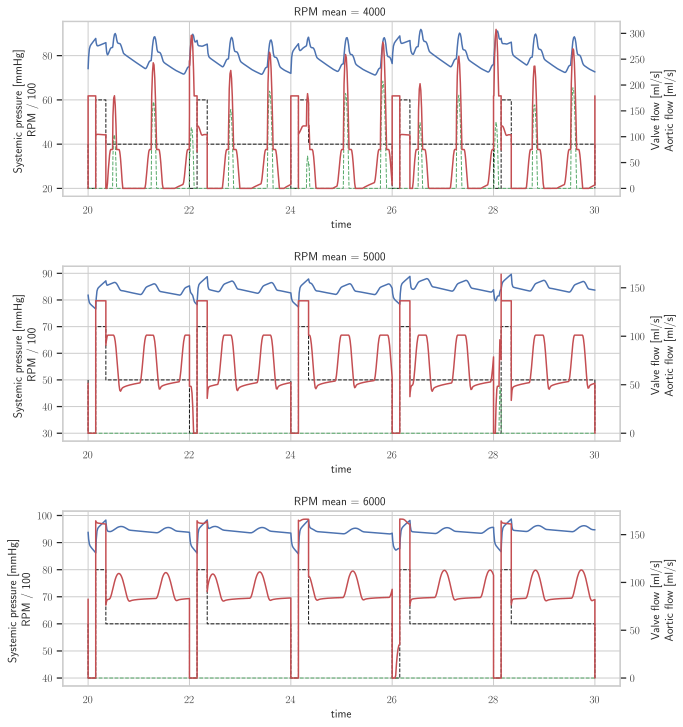

In [19]:
plot_simulations(data_sim['SHF'])

## Fourier coefficients

### Input data of DNN

5% of the Fourier coefficients were kept for simulations without pulsatility, which resulted in 6 $a_k$ and 5 $b_k$ coefficients. In order to have comparable results, we took the same number of coefficients for simulations that included the Artificial Pulse feature.

In [20]:
def get_b1_index(array_length):
    if array_length % 2 == 0:
        return int((array_length + 2) / 2)
    return int((array_length + 1) / 2)

In [21]:
file_fourier_pulse_5000 = '/media/maousi/Data/tmp/simulation_LVAD_RPM5000_Pulse_T30_N2000_2020_04_26/X.mat'
file_fourier_5000 = '/media/maousi/Data/tmp/simulation_LVAD_RPM5000_2020_04_21/X.mat'

In [22]:
fourier1 = sio.loadmat(file_fourier_pulse_5000)['X']
fourier2 = sio.loadmat(file_fourier_5000)['X']

In [23]:
fourier1_b1 = get_b1_index(fourier1.shape[2])
fourier2_b1 = get_b1_index(fourier2.shape[2])

In [146]:
def plot_coeffs(tensor, id_b1, nmax):
    def plot_for_var(ax, var, start, end, ylabel):
        # We ignore a0 and b0
        x = range(1, end-start + 1)
        ax.plot(x, tensor[:, var, start:end].mean(axis=0), zorder=2)
        ax.scatter(x, tensor[:, var, start:end].mean(axis=0), 
                   s=8, color='k', zorder=3)
        ax.set_ylabel('Mean ${}$'.format(ylabel))
        ax.set_xlabel('k')
    
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    # Plot aks for systemic arterial pressure
    plot_for_var(ax[0], 0, 1, nmax + 1, ylabel='a_k')
    # Plot bks for systemic arterial pressure
    plot_for_var(ax[1], 0, id_b1, id_b1 + nmax + 1, ylabel='b_k')
    plt.subplots_adjust(wspace=.3)

Text(0.5, 0.98, 'Pulsatile flow, RPM=5000, systemic arterial pressure')

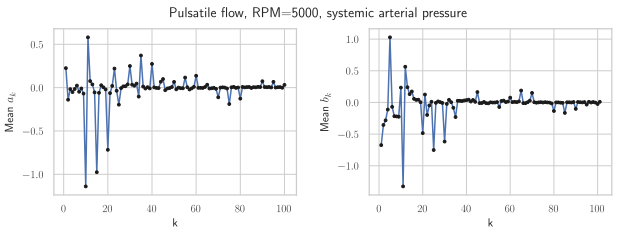

In [149]:
# Plot for pulsatile flow
plot_coeffs(fourier1, fourier1_b1, nmax=100)
plt.suptitle('Pulsatile flow, RPM=5000, systemic arterial pressure')

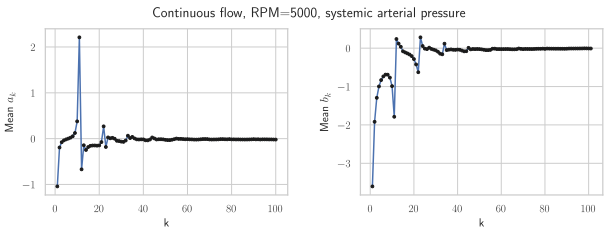

In [150]:
# Plot for continuous flow
plot_coeffs(fourier2, fourier2_b1, nmax=100)
plt.suptitle('Continuous flow, RPM=5000, systemic arterial pressure');

# DNN testing with artificial pulse

## RPM = 4000

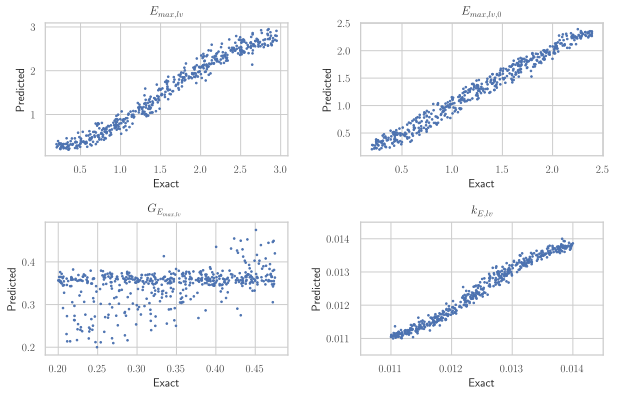

In [27]:
plot_dnn_performance(artificial_pulse=True, RPM=4000)

In [28]:
get_results_table(artificial_pulse=True, RPM=4000)

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,58.25,89.04,98.45,84.16,13.71,25.60,7.77,50.82,85.14,28.48,0.00e+00,2.97
Max exact,71.00,95.71,112.60,87.45,15.32,26.44,9.77,69.70,126.55,61.74,3.20e-01,5.04
Mean exact,64.72,90.93,102.51,85.14,14.54,25.99,8.81,59.43,104.97,42.81,-6.66e-02,3.96
SD exact,3.07,1.49,3.53,0.51,0.35,0.15,0.45,3.62,9.25,6.96,8.90e-02,0.43
Min predicted,58.25,88.88,98.43,83.96,13.69,25.59,7.73,50.31,86.10,28.09,0.00e+00,2.94
Max predicted,70.66,95.97,112.75,87.57,15.41,26.49,9.86,70.58,126.53,62.68,3.32e-01,5.12
Mean predicted,64.80,90.98,102.63,85.16,14.53,25.98,8.80,59.42,104.90,42.81,-7.06e-02,3.95
SD predicted,3.13,1.51,3.57,0.53,0.36,0.16,0.47,3.70,9.32,7.05,9.15e-02,0.44
Mean error matrix,0.74,0.12,0.25,0.06,0.03,0.02,0.04,0.62,0.98,0.81,6.12e-03,0.03
Mean rel error * 100,1.15,0.13,0.24,0.07,0.20,0.06,0.43,1.04,0.93,1.92,8.74e+00,0.90


## RPM = 5000

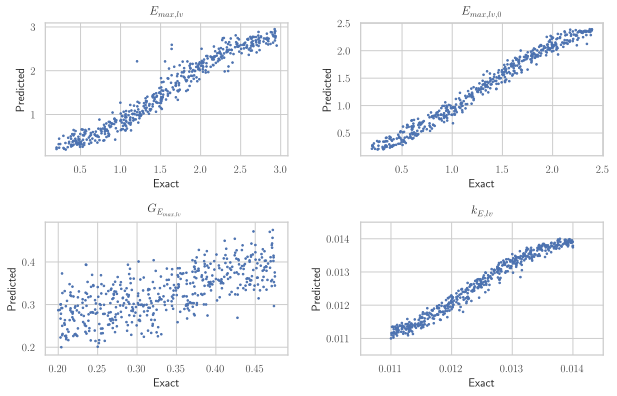

In [29]:
plot_dnn_performance(artificial_pulse=True, RPM=5000)

In [30]:
get_results_table(artificial_pulse=True, RPM=5000)

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,57.98,89.04,98.56,84.19,13.77,25.65,7.81,51.23,85.16,28.97,0.00e+00,3.01
Max exact,70.66,95.61,112.36,87.26,15.41,26.50,9.87,68.66,125.35,59.95,3.23e-01,5.12
Mean exact,64.84,90.93,102.56,85.12,14.53,25.98,8.80,59.63,104.47,42.41,-6.79e-02,3.95
SD exact,3.03,1.44,3.43,0.49,0.33,0.14,0.43,3.40,9.45,6.91,8.68e-02,0.41
Min predicted,57.59,89.07,98.49,84.15,13.70,25.60,7.75,49.96,85.32,28.08,0.00e+00,2.95
Max predicted,70.59,95.78,112.38,87.50,15.34,26.46,9.78,69.61,126.43,62.84,3.25e-01,5.02
Mean predicted,64.76,90.96,102.58,85.15,14.55,26.00,8.82,59.71,103.75,42.12,-7.01e-02,3.98
SD predicted,3.30,1.50,3.56,0.52,0.35,0.15,0.46,3.92,10.25,7.81,8.91e-02,0.43
Mean error matrix,0.95,0.14,0.28,0.08,0.04,0.03,0.05,0.83,1.40,1.21,5.93e-03,0.04
Mean rel error * 100,1.48,0.15,0.27,0.10,0.27,0.10,0.55,1.39,1.36,2.94,7.25e+00,1.10


## RPM = 6000

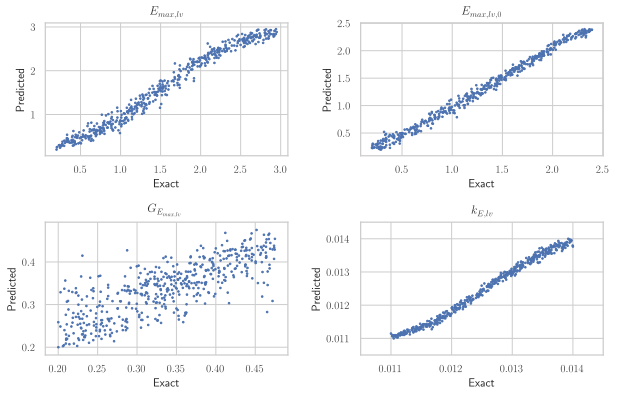

In [31]:
plot_dnn_performance(artificial_pulse=True, RPM=6000)

In [32]:
get_results_table(artificial_pulse=True, RPM=6000)

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,58.82,89.13,98.53,84.20,13.72,25.60,7.78,50.39,86.09,29.28,0.00e+00,2.98
Max exact,70.94,95.70,112.32,87.39,15.34,26.45,9.79,68.97,129.67,64.16,3.19e-01,5.06
Mean exact,64.66,90.90,102.46,85.12,14.55,25.99,8.83,59.66,104.70,42.47,-6.55e-02,3.97
SD exact,3.04,1.49,3.54,0.51,0.34,0.14,0.44,3.58,9.06,6.96,8.90e-02,0.42
Min predicted,58.25,89.00,98.42,84.11,13.70,25.60,7.75,50.19,86.34,28.86,0.00e+00,2.94
Max predicted,70.59,95.78,112.45,87.52,15.33,26.44,9.77,69.31,129.35,64.30,3.26e-01,5.02
Mean predicted,64.76,91.00,102.66,85.18,14.53,25.99,8.81,59.74,104.84,42.48,-7.10e-02,3.96
SD predicted,3.16,1.63,3.81,0.58,0.36,0.16,0.47,3.89,9.42,7.39,9.54e-02,0.45
Mean error matrix,0.78,0.13,0.28,0.07,0.03,0.02,0.04,0.58,0.78,0.71,6.47e-03,0.04
Mean rel error * 100,1.21,0.14,0.26,0.08,0.22,0.07,0.46,0.97,0.74,1.68,7.25e+00,1.01


## DNN performance with pulsatile flow at different RPM levels



In [33]:
# We load the DNN responses into a dataframe
# Columns: 4 parameters * 2 (pred/exact) + Art_Pulse + RPM
Y = pd.DataFrame(columns=dnnperf_params_ + ['art_pulse', 'RPM'])
for artificial_pulse, pathdic in results_folders.items():
    for rpm in pathdic:
        print(artificial_pulse, rpm)
        Ytest, Ypred = load_Ys(artificial_pulse, rpm)
        Yjoin = Ytest.join(Ypred, rsuffix='_pred')
        Yjoin['RPM'] = rpm
        Yjoin['art_pulse'] = artificial_pulse
        Y = pd.concat([Y, Yjoin])

Y.reset_index(drop=True, inplace=True)

False 4000
False 5000
False 6000
False 0
True 4000
True 5000
True 6000


In [34]:
Y

,Emax,Emax0,G_Emax,k_E,art_pulse,RPM,Emax_pred,Emax0_pred,G_Emax_pred,k_E_pred
0,2.25,2.11,0.44,0.01,False,4000,2.28,2.18,0.37,0.01
1,1.03,1.25,0.25,0.01,False,4000,1.02,1.16,0.27,0.01
2,1.81,1.24,0.35,0.01,False,4000,1.76,1.20,0.32,0.01
3,1.05,0.62,0.28,0.01,False,4000,0.85,0.46,0.33,0.01
4,1.64,0.98,0.42,0.01,False,4000,1.43,0.91,0.40,0.01
...,...,...,...,...,...,...,...,...,...,...
3494,1.17,0.28,0.39,0.01,True,6000,1.13,0.23,0.38,0.01
3495,2.64,2.37,0.31,0.01,True,6000,2.76,2.36,0.33,0.01
3496,1.46,0.37,0.39,0.01,True,6000,1.44,0.36,0.37,0.01
3497,0.43,1.96,0.29,0.01,True,6000,0.48,1.93,0.33,0.01


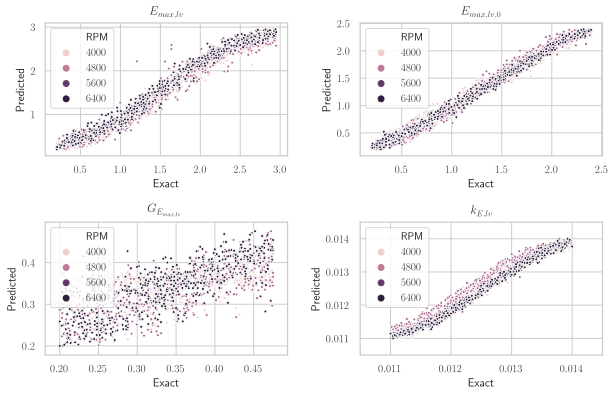

In [35]:
fig, ax = plt.subplots(2, 2, figsize=(10,6))
axlst = ax.ravel()

for i,col in enumerate(dnnperf_params_):
    sns.scatterplot(x=col, y=col+'_pred',
                    data=Y[Y.art_pulse==True],
                    s=8, hue='RPM', ax=axlst[i])
    axlst[i].set_title(dnnperf_params[i])
    axlst[i].set_xlabel(r'Exact')
    axlst[i].set_ylabel(r'Predicted')

offset = .0005
ax[1, 1].set_xlim([Y['k_E'].min()-offset, Y['k_E'].max()+offset])
ax[1, 1].set_ylim([Y['k_E'].min()-offset, Y['k_E'].max()+offset])

plt.subplots_adjust(wspace=0.3, hspace=.5)

## Predicted vs exact hemodynamic quantities under pulsatile flow conditions

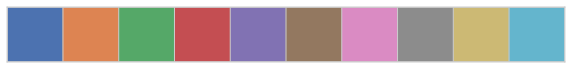

In [36]:
sns.palplot(sns.color_palette())

In [37]:
def load_X_data(artificial_pulse, RPM):
    Xhat = pd.read_csv(results_folders[artificial_pulse][RPM]+file_names['Xpred'], header=None)
    X = pd.read_csv(results_folders[artificial_pulse][RPM]+file_names['Xexact'], header=None)
    # Format columns
    cols = [
        'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
        'LVEDV', 'LVESV', 'CI', 'PCPW'
    ]
    Xhat.columns = cols
    X.columns = cols
    # Take abs (values of cardiac index are negative)
    X.CI = X.CI.apply(np.abs)
    Xhat.CI = Xhat.CI.apply(np.abs)
    # Join
    X = X.join(Xhat, rsuffix='_hat')
    # Specify 'context parameters'
    X['RPM'] = RPM
    X['art_pulse'] = artificial_pulse
    print(artificial_pulse, rpm)
    return X

In [38]:
X = []
for artificial_pulse in results_folders:
    for rpm in results_folders[artificial_pulse]:
        X.append(load_X_data(artificial_pulse, rpm))

X = pd.concat(X)
X.reset_index(drop=True, inplace=True)

False 4000
False 5000
False 6000
False 0
True 4000
True 5000
True 6000


In [39]:
def plt_compare(data, col, ax, legend=None):
    # Plot identity line
    coord1 = min(data[col].min(), data[col+'_hat'].min())
    coord2 = max(data[col].max(), data[col+'_hat'].max())
    ax.plot([coord1, coord2], [coord1, coord2], '--k')
    # Scatter plot predicted vs exact
    sns.scatterplot(x=col, y=col+'_hat', data=data, ax=ax, hue='RPM',
                    legend=legend, palette=sns.color_palette()[:3])
    ax.set_xlabel('$'+col+'$')
    ax.set_ylabel('$\widehat{' + col + '}$')

In [40]:
cols = [
    'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
    'LVEDV', 'LVESV', 'CI', 'PCPW'
]

In [41]:
fig, ax = plt.subplots(4, 3, figsize=(12, 15))
axlst = ax.ravel()

for i, col in enumerate(cols):
    plt_compare(X[X.art_pulse==True], col, axlst[i], 'full' if i == 1 else None)
plt.subplots_adjust(wspace=.3, hspace=.3)
sns.despine()

# Pulsatile vs continuous flow

## Density of hemodynamic quantities

We plot the kernel density esimations ([seaborn.kdeplot()](https://seaborn.pydata.org/generated/seaborn.kdeplot.html)) of some hemodynamic quantities to show that, under pulsatile flow conditions, a given quantity has the same distribution regardless the RPM level.

For each hemodynamic variable, we have 6 sets (3 rpm levels * 2 types of flow) of 500 simulations (performed with the exact parameters of the DNN test set, we do not show the predicted values here). Thus, we have 6 curves per variable, where each curve represents the kernel density estimation (~= distribution) of that variable.

In [42]:
X

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,...,PAPM_hat,PAPS_hat,PAPD_hat,LVEF_hat,LVEDV_hat,LVESV_hat,CI_hat,PCPW_hat,RPM,art_pulse
0,65.22,90.85,122.58,74.99,18.25,29.20,12.77,58.17,142.95,59.80,...,18.12,28.99,12.68,58.83,141.98,58.45,2.06,8.68,4000,False
1,62.50,94.70,126.60,78.76,16.72,28.00,11.08,57.53,158.08,67.13,...,16.66,28.01,10.99,58.47,156.19,64.86,2.12,6.81,4000,False
2,65.22,92.61,126.44,75.70,18.19,29.00,12.79,54.78,149.25,67.49,...,18.17,28.96,12.78,54.44,150.27,68.46,2.19,8.47,4000,False
3,62.50,93.79,126.44,77.46,17.36,28.54,11.77,58.57,148.72,61.61,...,17.19,28.38,11.59,58.97,149.55,61.37,2.05,7.45,4000,False
4,62.50,94.98,128.96,77.99,17.53,28.49,12.05,53.21,162.69,76.12,...,17.49,28.58,11.95,54.27,161.84,74.01,2.24,7.39,4000,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3495,69.49,93.46,108.76,85.80,13.95,25.76,8.05,60.59,100.60,39.64,...,13.95,25.76,8.05,59.92,100.11,40.12,0.22,3.24,6000,True
3496,68.97,91.27,103.41,85.21,14.35,25.93,8.56,58.17,97.38,40.74,...,14.25,25.91,8.42,56.76,95.55,41.31,0.14,3.63,6000,True
3497,70.00,95.30,112.01,86.94,13.79,25.70,7.83,68.13,98.48,31.39,...,13.77,25.70,7.81,69.00,98.09,30.41,0.33,3.01,6000,True
3498,63.49,89.44,99.40,84.45,14.89,26.15,9.26,57.43,109.13,46.46,...,14.89,26.15,9.26,57.52,108.71,46.18,0.00,4.41,6000,True


In [43]:
X.rename({'SAPM_hat':'SAPMhat'}, axis=1).columns

Index(['HR', 'SAPM', 'SAPS', 'SAPD', 'PAPM', 'PAPS', 'PAPD', 'LVEF', 'LVEDV',
       'LVESV', 'CI', 'PCPW', 'HR_hat', 'SAPMhat', 'SAPS_hat', 'SAPD_hat',
       'PAPM_hat', 'PAPS_hat', 'PAPD_hat', 'LVEF_hat', 'LVEDV_hat',
       'LVESV_hat', 'CI_hat', 'PCPW_hat', 'RPM', 'art_pulse'],
      dtype='object')

In [44]:
def fix_hat(df, col):
    return df.rename({col+'_hat':col+'hat'}, axis=1)

In [45]:
def filter_data(df, art_pulse, rpm, col):
    return df.loc[ (df.art_pulse == art_pulse) & (df.RPM == rpm), col ]

In [46]:
def setup_kde_ax(ax):
    unspine = ['right', 'top']
    for s in unspine:
        ax.spines[s].set_visible(False)
    
    #ax.set_yticks([])
    #ax.text(0, 0.1, axname, transform=ax.transAxes)
    ax.set_ylabel('Density')
    ax.get_legend().remove()
    ax.grid(False)

In [47]:
def plot_kde_for_col(col, ax1, ax2, units, loc='upper left'):
    sns.kdeplot(data=filter_data(X, False, 4000, col), ax=ax1)
    sns.kdeplot(data=filter_data(X, False, 5000, col), ax=ax1)
    sns.kdeplot(data=filter_data(X, False, 6000, col), ax=ax1)
    sns.kdeplot(data=filter_data(X, True, 4000, col), ax=ax2)
    sns.kdeplot(data=filter_data(X, True, 5000, col), ax=ax2)
    sns.kdeplot(data=filter_data(X, True, 6000, col), ax=ax2)
    ax1.set_xticks([])
    
    #setup_kde_ax(ax1, 'CF')
    #setup_kde_ax(ax2, 'PF')
    setup_kde_ax(ax1)
    setup_kde_ax(ax2)
    ax1.legend(['4000', '5000', '6000'], title='RPM', loc=loc)
    ax1.set_title('Continuous')
    ax2.set_xlabel(col + ', ' + units)
    ax2.set_title('Pulsatile')
    plt.suptitle(col)

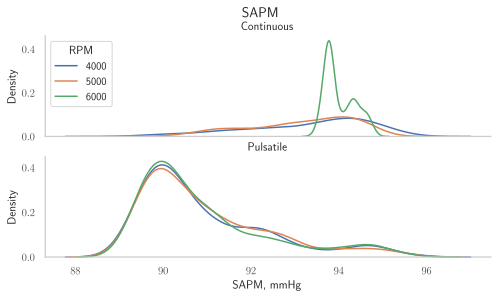

In [48]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('SAPM', ax1, ax2, units='mmHg')

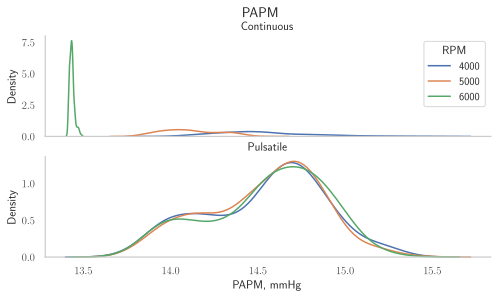

In [49]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('PAPM', ax1, ax2, 'mmHg', loc='upper right')

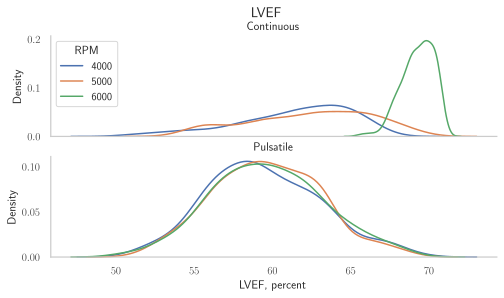

In [50]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('LVEF', ax1, ax2, units='percent')

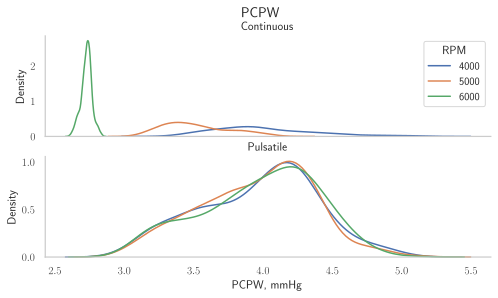

In [151]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('PCPW', ax1, ax2, units='mmHg', loc='upper right')

## Compare DNN performance

### Mean squared error of the 4 parameters

In [52]:
# Add a column squared error for each parameter
for col in dnnperf_params_:
    Y[col + '_sqerr'] = np.power((Y[col] - Y[col + '_pred']), 2)

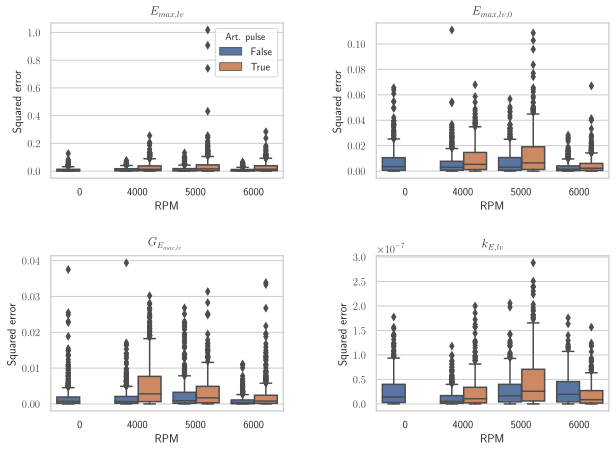

In [53]:
# Stackoverflow: assign a color to a specific box in seaborn.boxplot
# https://stackoverflow.com/a/36331317

fig, ax = plt.subplots(2, 2, figsize=(10, 7))
axlst = ax.ravel()

for i, col in enumerate(dnnperf_params_):
    p = sns.boxplot(x='RPM', y=col+'_sqerr', hue='art_pulse', 
                    data=Y, ax=axlst[i], dodge=True)
    axlst[i].set_ylabel('Squared error')
    axlst[i].set_title(dnnperf_params[i])
    # Manage legend
    if i == 0:
        axlst[i].get_legend().set_title('Art. pulse')
    else:
        axlst[i].get_legend().remove()
    # Manage color of box without LVAD
    #box_nolvad = p.artists[0]
    #box_nolvad.set_facecolor(sns.color_palette()[2])
    #box_nolvad.set_sketch_params(scale=0)
        
plt.subplots_adjust(wspace=.4, hspace=.5)

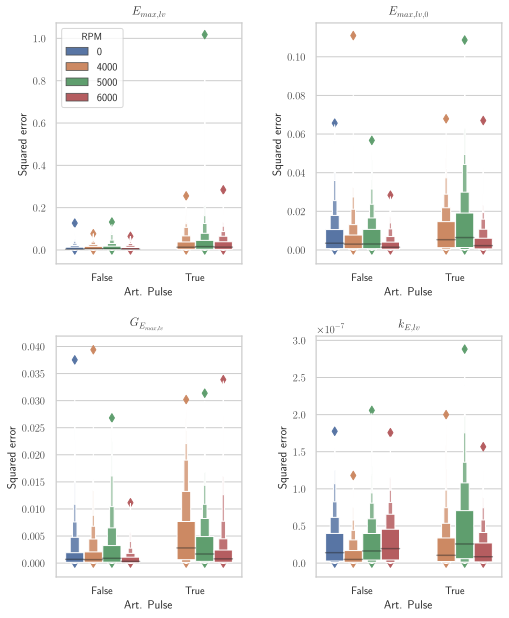

In [54]:
# Stackoverflow: assign a color to a specific box in seaborn.boxplot
# https://stackoverflow.com/a/36331317

fig, ax = plt.subplots(2, 2, figsize=(8, 10))
axlst = ax.ravel()

for i, col in enumerate(dnnperf_params_):
    p = sns.boxenplot(x='art_pulse', y=col+'_sqerr', hue='RPM', 
                    data=Y, ax=axlst[i], dodge=True)
    axlst[i].set_xlabel('Art. Pulse')
    axlst[i].set_ylabel('Squared error')
    axlst[i].set_title(dnnperf_params[i])
    # Manage legend
    if i == 0:
        pass
        #axlst[i].get_legend().set_title('RPM')
    else:
        axlst[i].get_legend().remove()
    # Manage color of box without LVAD
    #box_nolvad = p.artists[0]
    #box_nolvad.set_facecolor(sns.color_palette()[2])
    #box_nolvad.set_sketch_params(scale=0)
        
plt.subplots_adjust(wspace=.4, hspace=.3)

In [55]:
# We build a table for mean squared errors
mse_columns = [['Continuous', 'Pulsatile'], dnnperf_params_]
mse_columns = pd.MultiIndex.from_product(mse_columns, names=['Flow', 'Parameter'])
Ymse = pd.DataFrame(columns=mse_columns)
Ymse

Empty DataFrame
Columns: [(Continuous, Emax), (Continuous, Emax0), (Continuous, G_Emax), (Continuous, k_E), (Pulsatile, Emax), (Pulsatile, Emax0), (Pulsatile, G_Emax), (Pulsatile, k_E)]
Index: []

In [65]:
Ymse = Y.groupby(['RPM', 'art_pulse']).mean()
Ymse = Ymse[ [col+'_sqerr' for col in dnnperf_params_] ]
Ymse.columns = [col for col in dnnperf_params_]

In [66]:
Ymse.index.rename(['RPM', 'Artificial Pulse'], inplace=True)

In [67]:
Ymse.rename(dict(zip(dnnperf_params_,dnnperf_params)), axis=1)

$E_{max,lv}$  $E_{max,lv,0}$  $G_{E_{max,lv}}$  \
RPM  Artificial Pulse                                                   
0    False                 8.97e-03        7.46e-03          2.00e-03   
4000 False                 1.12e-02        6.05e-03          1.85e-03   
     True                  2.80e-02        9.34e-03          5.37e-03   
5000 False                 1.41e-02        7.08e-03          2.77e-03   
     True                  3.92e-02        1.29e-02          3.40e-03   
6000 False                 8.55e-03        3.07e-03          8.26e-04   
     True                  2.66e-02        4.62e-03          2.18e-03   

                       $k_{E,lv}$  
RPM  Artificial Pulse              
0    False               2.60e-08  
4000 False               1.25e-08  
     True                2.32e-08  
5000 False               2.66e-08  
     True                4.53e-08  
6000 False               2.92e-08  
     True                1.76e-08

In [68]:
Ymse.transpose()

RPM                   0         4000                5000                6000  \
Artificial Pulse     False     False     True      False     True      False   
Emax              8.97e-03  1.12e-02  2.80e-02  1.41e-02  3.92e-02  8.55e-03   
Emax0             7.46e-03  6.05e-03  9.34e-03  7.08e-03  1.29e-02  3.07e-03   
G_Emax            2.00e-03  1.85e-03  5.37e-03  2.77e-03  3.40e-03  8.26e-04   
k_E               2.60e-08  1.25e-08  2.32e-08  2.66e-08  4.53e-08  2.92e-08   

RPM                         
Artificial Pulse     True   
Emax              2.66e-02  
Emax0             4.62e-03  
G_Emax            2.18e-03  
k_E               1.76e-08

In [60]:
# Idea for plot of table for MSE:
# group data in a different way, put a column 'param' being Emax, Emax0, ...
# and basically make a catplot with col='param'

### Relative error of hemodynamic quantities

In [61]:
cols = [
    'HR','SAPM','SAPS','SAPD',
    'PAPM','PAPS','PAPD','LVEF',
    'LVEDV', 'LVESV', 'CI', 'PCPW'
]

In [62]:
for col in cols:
    X[col+'_relerr'] = np.abs(X[col] - X[col+'_hat']) / X[col] * 100

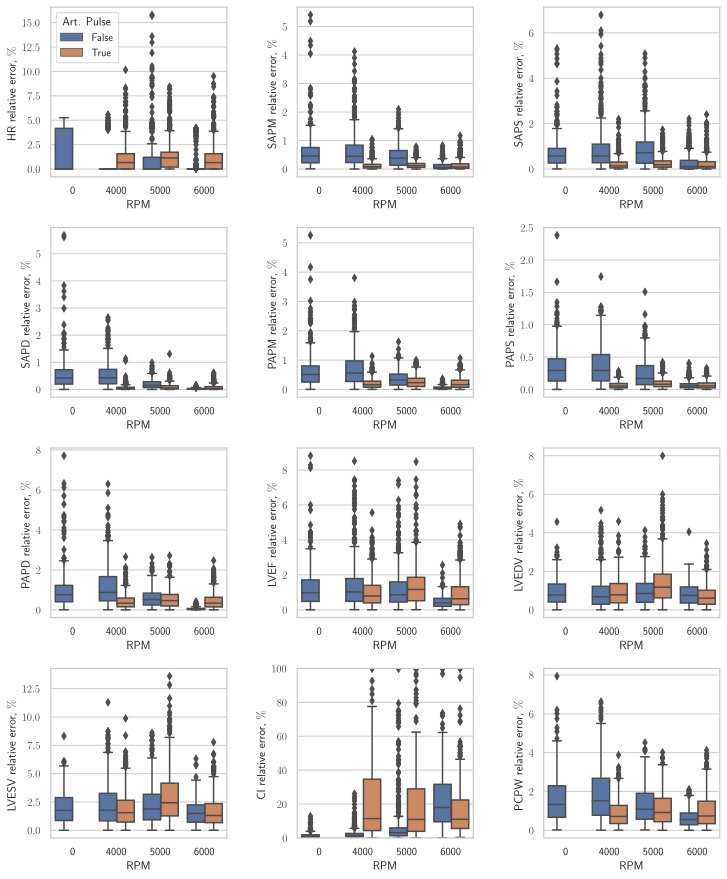

In [64]:
fig, ax = plt.subplots(4, 3, figsize=(12, 15))
axlst = ax.ravel()
sns.set(style='whitegrid')

for i, col in enumerate(cols):
    #if col == 'CI':
    #    data = X[X.CI_relerr < 100]
    #else:
    #    data = X
        
    sns.boxplot(x='RPM', y=col+'_relerr', data=data, ax=axlst[i], hue='art_pulse')
    axlst[i].set_ylabel(col + r' relative error, $\%$')
    if i == 0:
        axlst[i].legend(title='Art. Pulse', loc='upper left')
    else:
        axlst[i].get_legend().remove()
    
    if col == 'CI':
        axlst[i].set_ylim([0, 100])

plt.subplots_adjust(wspace=.4, hspace=.3)